# **Introduction**

# **Imports**

In [1]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [2]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

# **Data**

In [3]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

In [4]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [5]:
SIZE = 256

In [6]:
root_path = 'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes

['benign', 'malignant', 'normal']

In [7]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])


In [8]:
single_mask_paths

[['C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (1)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (10)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (100)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (101)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (102)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (103)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (104)_mask.png',
  'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign\\benign (105)_mask.png',
  '

In [9]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

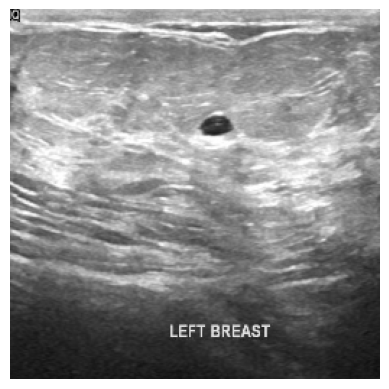

In [10]:
show_image(load_image(image_paths[0], SIZE))

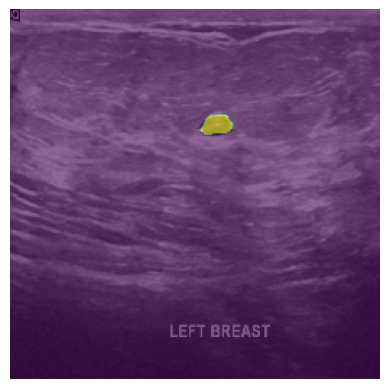

In [11]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

## **Approach**

Below here I have explained my strategy to tackel the multiple mask Images.

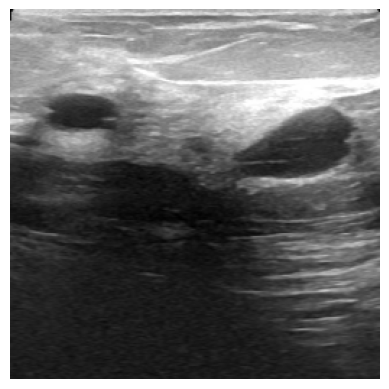

In [12]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))

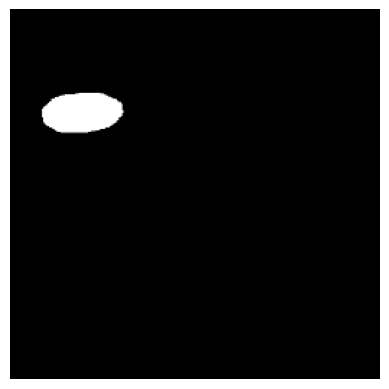

In [13]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE))

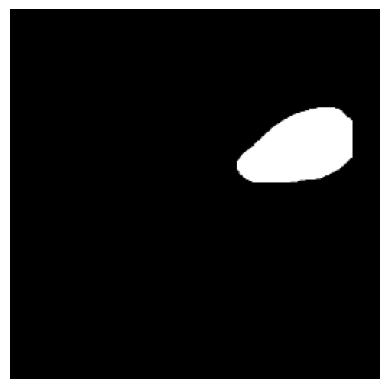

In [14]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE))

I don't want the data this way, as both the masks belongs to the same class. A better idea can be to merge both these images

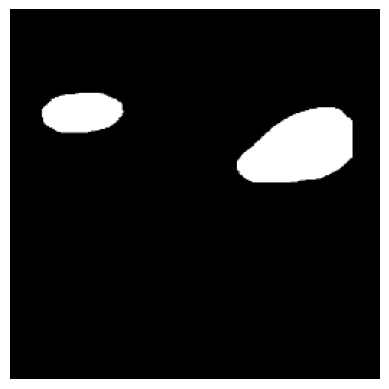

In [15]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE)
mask2 = load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

We first merged them and them simple used the 1st channel because that is enough.

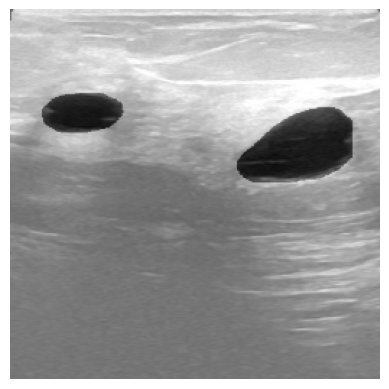

In [16]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()

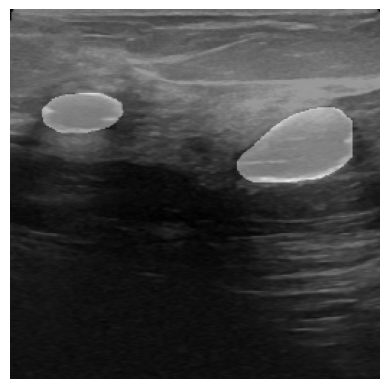

In [17]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

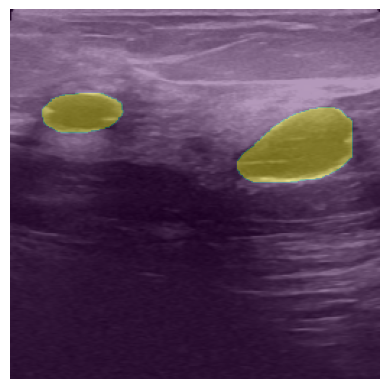

In [18]:
show_image(load_image('C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/Dataset_BUSI_with_GT/benign/benign (100).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

This is how it looks with different cmaps. But you can drop them as then are very less in number (i.e 16) and this will not affect training much.

## **Data Work**

In [19]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

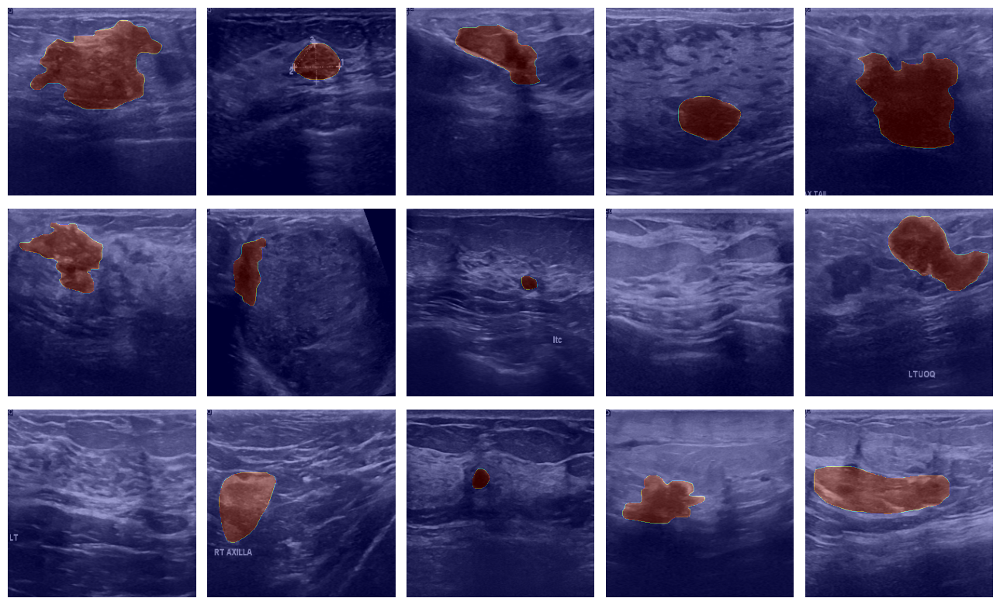

In [20]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

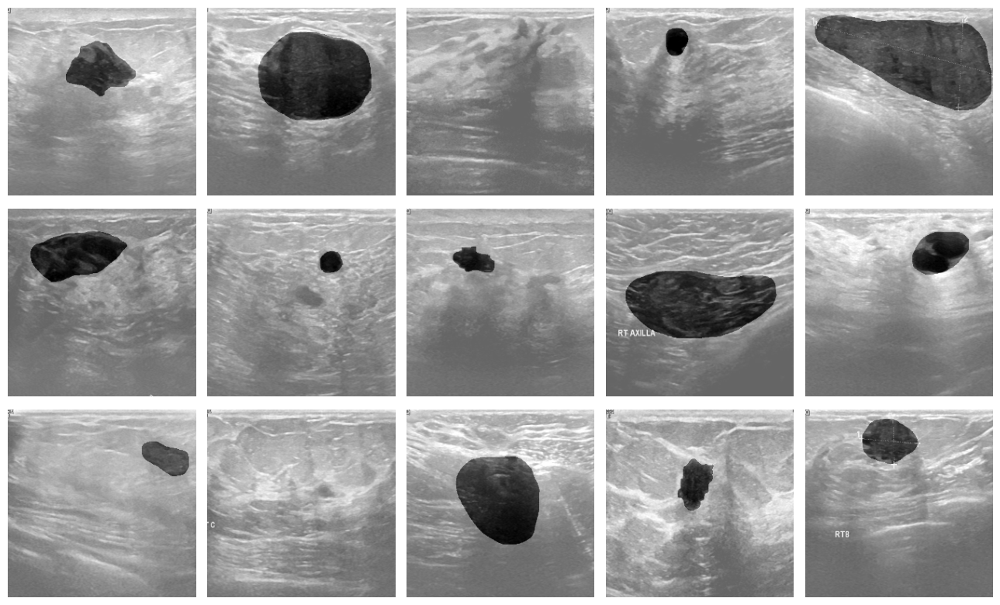

In [21]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

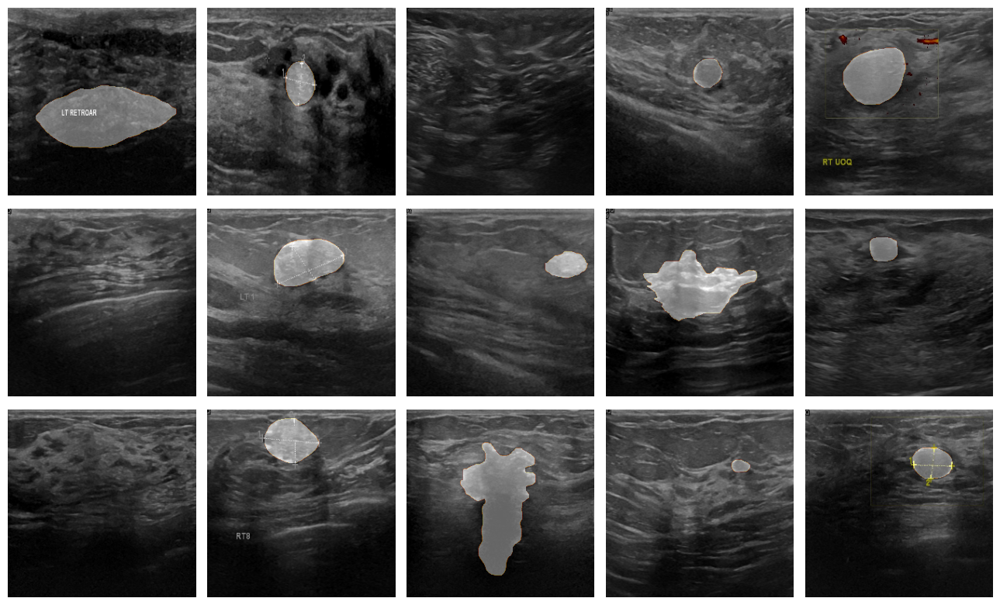

In [22]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

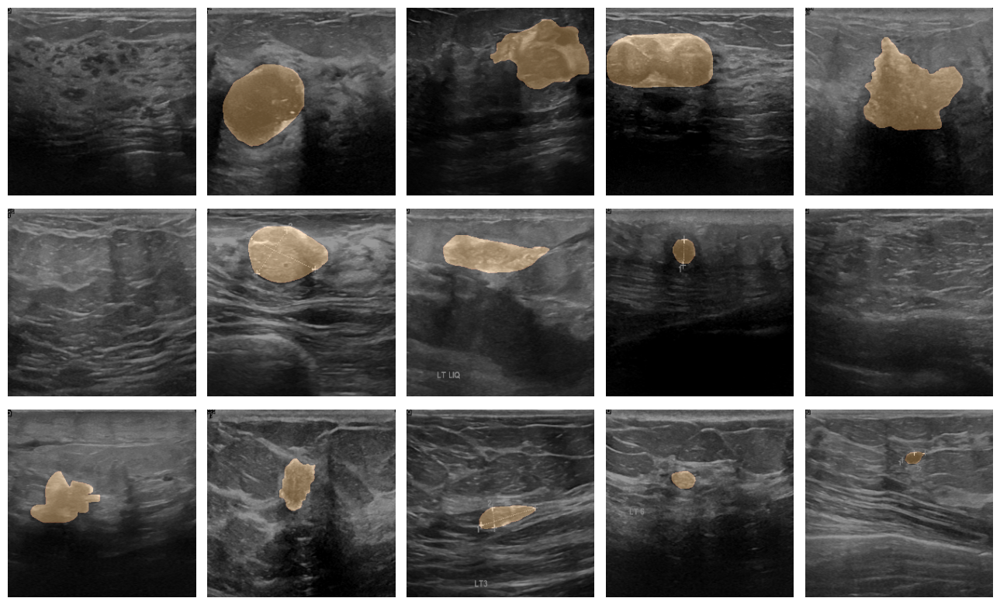

In [23]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

# **Encoder**

In [121]:
from keras.saving import register_keras_serializable

@register_keras_serializable
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

# **Decoder**

In [25]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

# **Attention Gate**

In [26]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

# **Custom Callback**

In [27]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

# **Attention UNet**

In [ ]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    ModelCheckpoint("BreastCancerAttentionUNet.keras", save_best_only=True),  # Use .keras extension
    #ShowProgress()
]


# **Training**

In [ ]:
# Config Training
BATCH_SIZE = 8
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=20, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
   
)



In [29]:
# Config Training
BATCH_SIZE = 8

# Calculate steps per epoch (assuming your 'images' data is a list or NumPy array)
SPE = len(images) // BATCH_SIZE  # Integer division for number of batches

# Training
results = model.fit(  
    images, masks,
    validation_split=0.2,
    epochs=400,  # Adjust epochs as needed, higher for potentially better models
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

Epoch 1/400
78/97 ━━━━━━━━━━━━━━━━━━━━ 1:41 5s/step - IoU: 0.4539 - accuracy: 0.8791 - loss: 1.4051

C:\ProgramData\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


97/97 ━━━━━━━━━━━━━━━━━━━━ 449s 4s/step - IoU: 0.4541 - accuracy: 0.8811 - loss: 1.2393 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.3690
Epoch 2/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 431s 4s/step - IoU: 0.4547 - accuracy: 0.9073 - loss: 0.2450 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.3001
Epoch 3/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step - IoU: 0.4560 - accuracy: 0.9107 - loss: 0.2313 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.2802
Epoch 4/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step - IoU: 0.4551 - accuracy: 0.9121 - loss: 0.2196 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.1906
Epoch 5/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 408s 4s/step - IoU: 0.4555 - accuracy: 0.9188 - loss: 0.2103 - val_IoU: 0.4909 - val_accuracy: 0.9814 - val_loss: 0.1303
Epoch 6/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step - IoU: 0.4526 - accuracy: 0.9153 - loss: 0.2117 - val_IoU: 0.4909 - val_accuracy: 0.9813 - val_loss: 0.0973
Epoch 7/400
97/97 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step 

In [ ]:
 ModelCheckpoint("BreastCancerAttentionUNet2.keras", save_best_only=True)

In [122]:
model.save("model.keras")

In [ ]:
loaded_model = tf.keras.models.load_model("model.keras")

# **Evaluation**

In [125]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

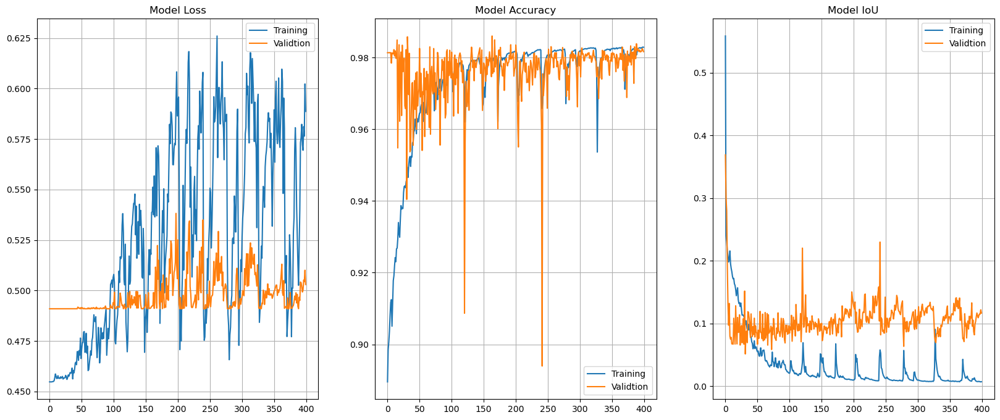

In [126]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


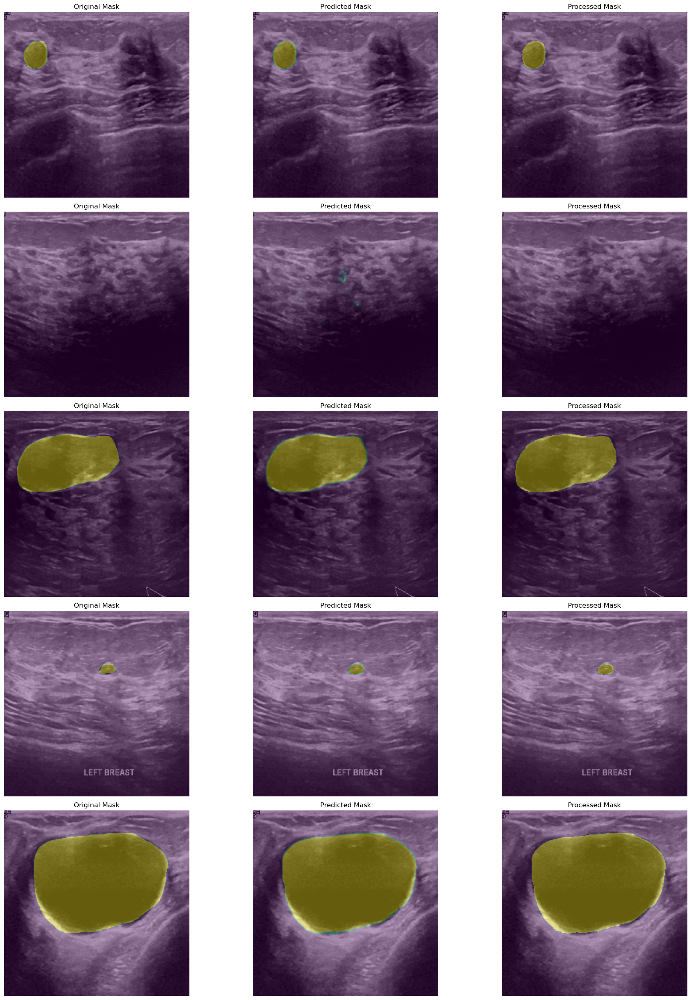

In [94]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

In [83]:
pred_mask = model.predict(image[np.newaxis, ...])
print(pred_mask.shape)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
(1, 256, 256, 1)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

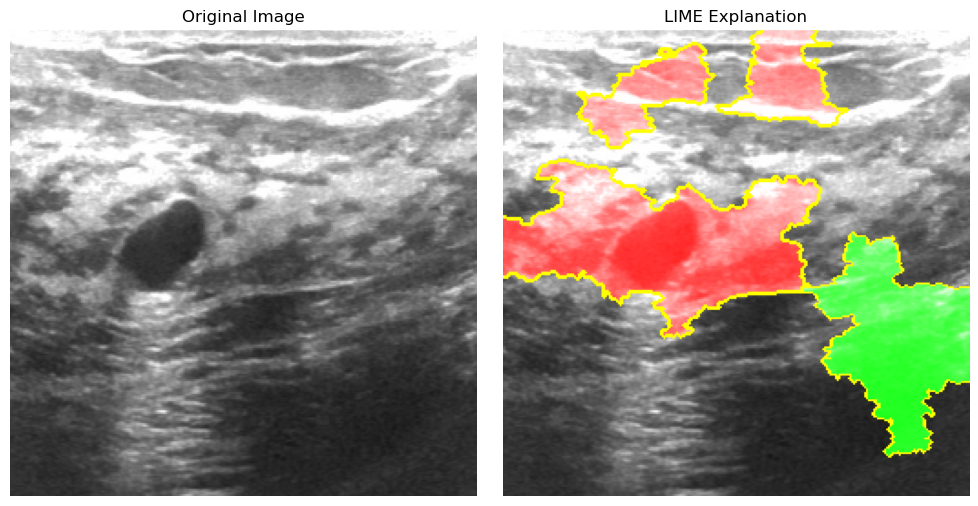

In [86]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Custom predict function for LIME
def custom_predict(images):
    # Make predictions using your model
    predictions = model.predict(images)
    
    # For each image, sum the segmentation mask and return as a scalar
    # This ensures that the output is a 2D array where each entry is a single prediction score
    return np.array([[pred.sum()] for pred in predictions])

# Assuming 'model' is your trained model and 'image' is the input image
lime_explainer = lime_image.LimeImageExplainer()

# Remove batch and channel dimensions if necessary (if pred_mask.shape is (1, 256, 256, 1))
image_3d = np.squeeze(image)  # This ensures the image is (256, 256)

# Generate LIME explanation
explanation = lime_explainer.explain_instance(
    image_3d,
    custom_predict,  # Use the custom predict function
    top_labels=1,    # Explaining the top predicted class
    hide_color=0,    # Hides regions in gray when not explaining
    num_samples=1000 # Number of perturbations to generate
)

# Get the LIME explanation image and mask for the top predicted label
lime_image, lime_mask = explanation.get_image_and_mask(
    label=explanation.top_labels[0],  # The label to explain
    positive_only=False,              # Show both positive and negative areas
    hide_rest=False,                  # Do not hide other parts of the image
    num_features=10                   # Number of superpixels to highlight
)

# Visualize the explanation with boundaries
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image_3d, cmap='gray')  # Original image
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("LIME Explanation")
plt.imshow(mark_boundaries(lime_image, lime_mask))  # LIME explanation with boundaries
plt.axis('off')

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

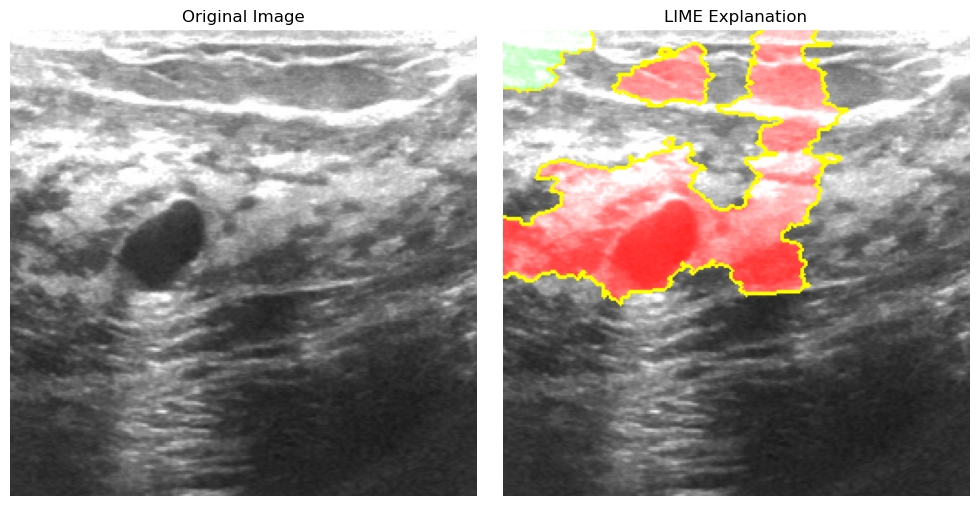

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Custom predict function for LIME
def custom_predict(images):
    # Make predictions using your model
    predictions = model.predict(images)
    
    # For each image, sum the segmentation mask and return as a scalar
    # This ensures that the output is a 2D array where each entry is a single prediction score
    return np.array([[pred.sum()] for pred in predictions])

# Assuming 'model' is your trained model and 'image' is the input image
lime_explainer = lime_image.LimeImageExplainer()

# Remove batch and channel dimensions if necessary (if pred_mask.shape is (1, 256, 256, 1))
image_3d = np.squeeze(image)  # This ensures the image is (256, 256)

# Generate LIME explanation
explanation = lime_explainer.explain_instance(
    image_3d,
    custom_predict,  # Use the custom predict function
    top_labels=1,    # Explaining the top predicted class
    hide_color=0,    # Hides regions in gray when not explaining
    num_samples=1000 # Number of perturbations to generate
)

# Get the LIME explanation image and mask for the top predicted label
lime_image, lime_mask = explanation.get_image_and_mask(
    label=explanation.top_labels[0],  # The label to explain
    positive_only=False,              # Show both positive and negative areas
    hide_rest=False,                  # Do not hide other parts of the image
    num_features=10                   # Number of superpixels to highlight
)

# Visualize the explanation with boundaries
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image_3d, cmap='gray')  # Original image
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("LIME Explanation")
plt.imshow(mark_boundaries(lime_image, lime_mask))  # LIME explanation with boundaries
plt.axis('off')

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

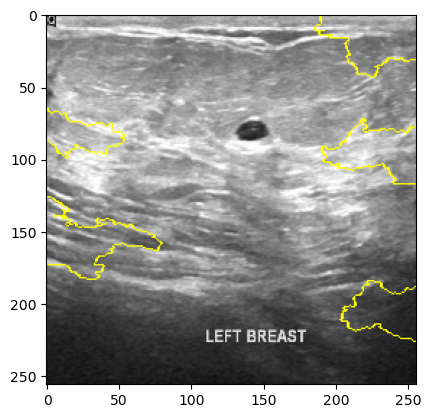

In [90]:
# Import LIME
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

# ... (rest of your existing code) ...
def custom_predict(images):
    # Make predictions using your model
    predictions = model.predict(images)
    
    # For each image, sum the segmentation mask and return as a scalar
    # This ensures that the output is a 2D array where each entry is a single prediction score
    return np.array([[pred.sum()] for pred in predictions])
    
# Prediction Function
def predict_fn(images):
    # Ensure images are in the correct format (e.g., float32, normalized)
    images = np.array(images)  # If images is a list, convert to NumPy array
    images = images.astype('float32') / 255.0  # Normalize if needed

    # Make predictions using your model
    predictions = model.predict(images)

    # LIME expects probabilities for each class
    # If your model's output is already in probability format, you're good
    # Otherwise, convert logits to probabilities if necessary (e.g., using softmax)

    return predictions

# Example usage
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(
    images[0],  # Choose an image to explain
    custom_predict,
    top_labels=2,  # Number of classes to explain (2 in your case)
    hide_color=0,  # Color to hide during perturbations (black usually)
    num_samples=1000  # Number of perturbed images to generate
)

# Get the explanation for the top class (e.g., class 1 - presence of mask)
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=True
)

# Visualize the explanation
plt.imshow(mark_boundaries(images[0], mask))
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

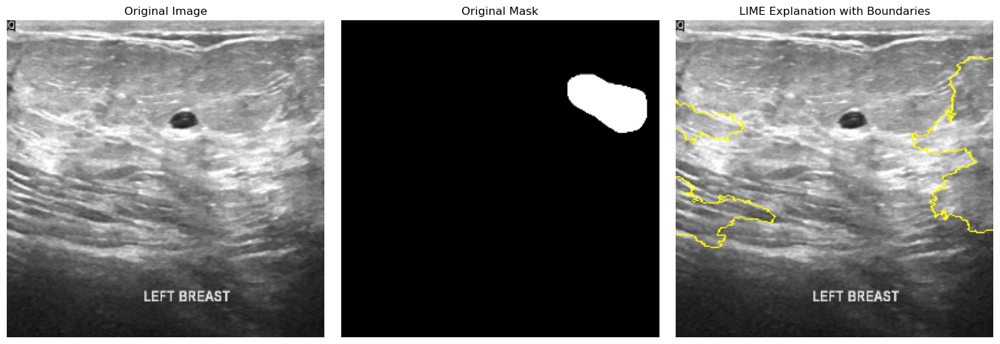

In [91]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Custom predict function for LIME
def custom_predict(images):
    # Make predictions using your model
    predictions = model.predict(images)
    
    # For each image, sum the segmentation mask and return as a scalar
    # This ensures that the output is a 2D array where each entry is a single prediction score
    return np.array([[pred.sum()] for pred in predictions])

# Prediction Function for normalization (if needed)
def predict_fn(images):
    images = np.array(images)  # If images is a list, convert to NumPy array
    images = images.astype('float32') / 255.0  # Normalize if needed
    return model.predict(images)

# Create an instance of the explainer
explainer = lime_image.LimeImageExplainer()

# Generate LIME explanation for a single image
explanation = explainer.explain_instance(
    images[0],  # Original image you want to explain
    custom_predict,
    top_labels=2,  # Number of top labels to explain
    hide_color=0,  # Color to hide areas (black usually)
    num_samples=1000  # Number of samples to generate
)

# Get LIME explanation for the top predicted class
temp, lime_mask = explanation.get_image_and_mask(
    explanation.top_labels[0],  # The label to explain
    positive_only=True,         # Show only the important areas
    num_features=5,             # Number of features (superpixels) to highlight
    hide_rest=False             # Do not hide other regions
)

# Visualize Original Image, Mask, and LIME Explanation with Boundaries
plt.figure(figsize=(15, 5))

# Display the original image
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(images[0], cmap='gray')
plt.axis('off')

# Display the mask (ground truth) of the original image (if available)
plt.subplot(1, 3, 2)
plt.title("Original Mask")
plt.imshow(np.squeeze(masks[0]), cmap='gray')  # Assuming true_mask is your ground truth mask
plt.axis('off')

# Display the LIME explanation with the predicted boundaries
plt.subplot(1, 3, 3)
plt.title("LIME Explanation with Boundaries")
plt.imshow(mark_boundaries(images[0], lime_mask))
plt.axis('off')

plt.tight_layout()
plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

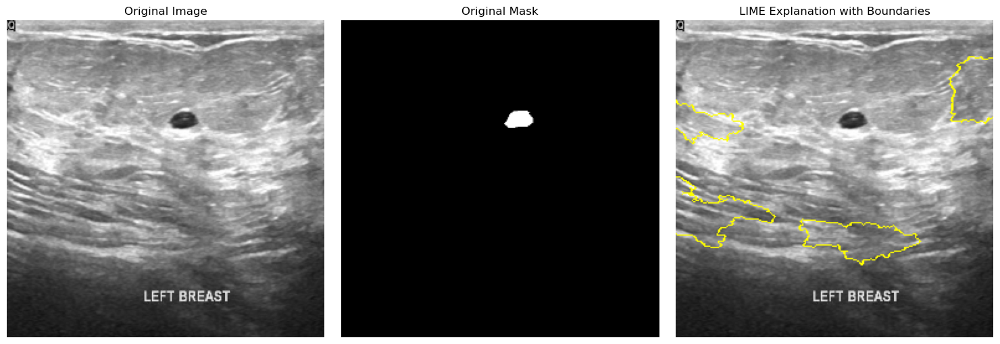

In [92]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Custom predict function for LIME
def custom_predict(images):
    # Make predictions using your model
    predictions = model.predict(images)
    
    # For each image, sum the segmentation mask and return as a scalar
    # This ensures that the output is a 2D array where each entry is a single prediction score
    return np.array([[pred.sum()] for pred in predictions])

# Prediction Function for normalization (if needed)
def predict_fn(images):
    images = np.array(images)  # If images is a list, convert to NumPy array
    images = images.astype('float32') / 255.0  # Normalize if needed
    return model.predict(images)

# Create an instance of the explainer
explainer = lime_image.LimeImageExplainer()

# Generate LIME explanation for a single image
explanation = explainer.explain_instance(
    images[0],  # Original image you want to explain
    custom_predict,
    top_labels=2,  # Number of top labels to explain
    hide_color=0,  # Color to hide areas (black usually)
    num_samples=1000  # Number of samples to generate
)

# Get LIME explanation for the top predicted class
temp, lime_mask = explanation.get_image_and_mask(
    explanation.top_labels[0],  # The label to explain
    positive_only=True,         # Show only the important areas
    num_features=5,             # Number of features (superpixels) to highlight
    hide_rest=False             # Do not hide other regions
)

# Visualize Original Image, Mask, and LIME Explanation with Boundaries
plt.figure(figsize=(15, 5))

# Display the original image
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(images[0], cmap='gray')
plt.axis('off')

# Display the mask (ground truth) of the original image (if available)
plt.subplot(1, 3, 2)
plt.title("Original Mask")
plt.imshow(np.squeeze(masks[0]), cmap='gray')  # Assuming true_mask is your ground truth mask
plt.axis('off')

# Display the LIME explanation with the predicted boundaries
plt.subplot(1, 3, 3)
plt.title("LIME Explanation with Boundaries")
plt.imshow(mark_boundaries(images[0], lime_mask))
plt.axis('off')

plt.tight_layout()
plt.show()


In [35]:
root_path = 'C://Users/Muruganantham J/Documents/Research/Codes/BreastCancer_UNET/BrEaST-Lesions_USG-images_and_masks/'
classes2 = sorted(os.listdir(root_path))
classes2

['tumor']

In [36]:
single_mask_paths2 = sorted([sorted(glob(root_path + name + "/*_tumor.png")) for name in classes2])


In [103]:
image_paths2 = []
mask_paths2 = []
for class_path2 in single_mask_paths2:
    for path2 in class_path2:
        img_path2 = path2.replace('_tumor','')
        image_paths2.append(img_path2)
        mask_paths2.append(path2)

In [104]:
images2 = load_images(image_paths2, SIZE)
masks2 = load_images(mask_paths2, SIZE, mask=True)

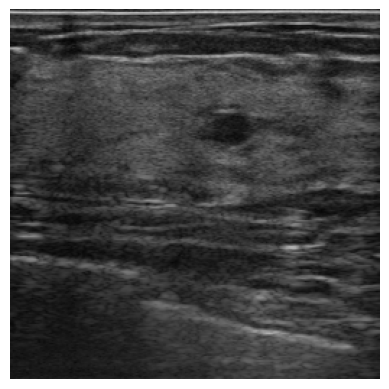

In [106]:
show_image(images2[3])

In [ ]:
# Config Training
BATCH_SIZE = 4

# Calculate steps per epoch (assuming your 'images' data is a list or NumPy array)
SPE = len(images) // BATCH_SIZE  # Integer division for number of batches

# Training
results = model.fit(
    images2, masks2,
    validation_split=0.2,
    epochs=20,  # Adjust epochs as needed, higher for potentially better models
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,

)

In [ ]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

In [ ]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


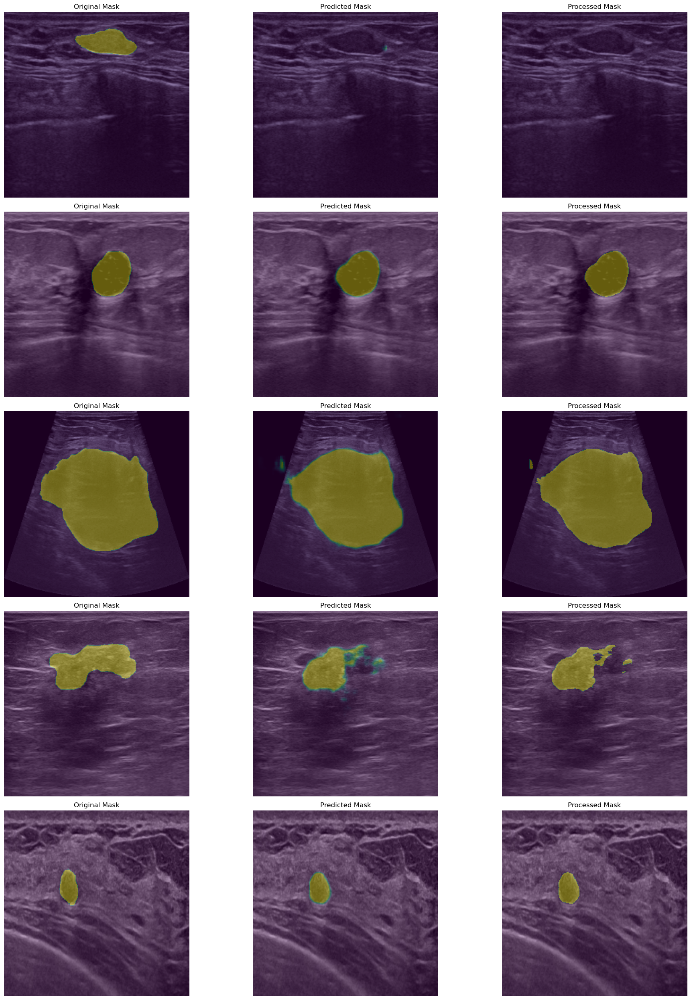

In [119]:



plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images2))
        image2 = images2[id]
        mask2 = masks2[id]
        pred_mask2 = model.predict(image2[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image2, mask2)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image2, pred_mask2)
        n+=1
    elif n==2:
        pred_mask2 = (pred_mask2>0.6).astype('float')
        plt.title("Processed Mask")
        show_mask(image2, pred_mask2)
        n=0
plt.tight_layout()
plt.show()

In [124]:
import tensorflow as tf

keras_model = tf.keras.models.load_model("model.keras")

TypeError: <class 'keras.src.models.functional.Functional'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras.src.models.functional', 'class_name': 'Functional', 'config': {'name': 'functional', 'trainable': True, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': [None, 256, 256, 3], 'dtype': 'float32', 'sparse': False, 'name': 'input_layer'}, 'registered_name': None, 'name': 'input_layer', 'inbound_nodes': []}, {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoder1', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'filters': 32, 'rate': 0.1, 'pooling': True}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 256, 256, 3]}, 'name': 'Encoder1', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 256, 256, 3], 'dtype': 'float32', 'keras_history': ['input_layer', 0, 0]}}], 'kwargs': {}}]}, {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoder2', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 64, 'rate': 0.1, 'pooling': True}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 128, 128, 32]}, 'name': 'Encoder2', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 128, 128, 32], 'dtype': 'float32', 'keras_history': ['Encoder1', 0, 0]}}], 'kwargs': {}}]}, {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoder3', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 128, 'rate': 0.2, 'pooling': True}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 64, 64, 64]}, 'name': 'Encoder3', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 64, 64, 64], 'dtype': 'float32', 'keras_history': ['Encoder2', 0, 0]}}], 'kwargs': {}}]}, {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoder4', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 256, 'rate': 0.2, 'pooling': True}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 32, 32, 128]}, 'name': 'Encoder4', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 32, 32, 128], 'dtype': 'float32', 'keras_history': ['Encoder3', 0, 0]}}], 'kwargs': {}}]}, {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoding', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 512, 'rate': 0.3, 'pooling': False}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 16, 16, 256]}, 'name': 'Encoding', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 16, 16, 256], 'dtype': 'float32', 'keras_history': ['Encoder4', 0, 0]}}], 'kwargs': {}}]}, {'module': None, 'class_name': 'AttentionGate', 'config': {'name': 'Attention1', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 256, 'bn': True}, 'registered_name': 'AttentionGate', 'build_config': {'input_shape': [[None, 16, 16, 512], [None, 32, 32, 256]]}, 'name': 'Attention1', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 16, 16, 512], 'dtype': 'float32', 'keras_history': ['Encoding', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 32, 32, 256], 'dtype': 'float32', 'keras_history': ['Encoder4', 0, 1]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'DecoderBlock', 'config': {'name': 'Decoder1', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 256, 'rate': 0.2}, 'registered_name': 'DecoderBlock', 'build_config': {'input_shape': [[None, 16, 16, 512], [None, 32, 32, 256]]}, 'name': 'Decoder1', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 16, 16, 512], 'dtype': 'float32', 'keras_history': ['Encoding', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 32, 32, 256], 'dtype': 'float32', 'keras_history': ['Attention1', 0, 0]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'AttentionGate', 'config': {'name': 'Attention2', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 128, 'bn': True}, 'registered_name': 'AttentionGate', 'build_config': {'input_shape': [[None, 32, 32, 256], [None, 64, 64, 128]]}, 'name': 'Attention2', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 32, 32, 256], 'dtype': 'float32', 'keras_history': ['Decoder1', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 64, 64, 128], 'dtype': 'float32', 'keras_history': ['Encoder3', 0, 1]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'DecoderBlock', 'config': {'name': 'Decoder2', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 128, 'rate': 0.2}, 'registered_name': 'DecoderBlock', 'build_config': {'input_shape': [[None, 32, 32, 256], [None, 64, 64, 128]]}, 'name': 'Decoder2', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 32, 32, 256], 'dtype': 'float32', 'keras_history': ['Decoder1', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 64, 64, 128], 'dtype': 'float32', 'keras_history': ['Attention2', 0, 0]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'AttentionGate', 'config': {'name': 'Attention3', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 64, 'bn': True}, 'registered_name': 'AttentionGate', 'build_config': {'input_shape': [[None, 64, 64, 128], [None, 128, 128, 64]]}, 'name': 'Attention3', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 64, 64, 128], 'dtype': 'float32', 'keras_history': ['Decoder2', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 128, 128, 64], 'dtype': 'float32', 'keras_history': ['Encoder2', 0, 1]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'DecoderBlock', 'config': {'name': 'Decoder3', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 64, 'rate': 0.1}, 'registered_name': 'DecoderBlock', 'build_config': {'input_shape': [[None, 64, 64, 128], [None, 128, 128, 64]]}, 'name': 'Decoder3', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 64, 64, 128], 'dtype': 'float32', 'keras_history': ['Decoder2', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 128, 128, 64], 'dtype': 'float32', 'keras_history': ['Attention3', 0, 0]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'AttentionGate', 'config': {'name': 'Attention4', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 32, 'bn': True}, 'registered_name': 'AttentionGate', 'build_config': {'input_shape': [[None, 128, 128, 64], [None, 256, 256, 32]]}, 'name': 'Attention4', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 128, 128, 64], 'dtype': 'float32', 'keras_history': ['Decoder3', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 256, 256, 32], 'dtype': 'float32', 'keras_history': ['Encoder1', 0, 1]}}]], 'kwargs': {}}]}, {'module': None, 'class_name': 'DecoderBlock', 'config': {'name': 'Decoder4', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 32, 'rate': 0.1}, 'registered_name': 'DecoderBlock', 'build_config': {'input_shape': [[None, 128, 128, 64], [None, 256, 256, 32]]}, 'name': 'Decoder4', 'inbound_nodes': [{'args': [[{'class_name': '__keras_tensor__', 'config': {'shape': [None, 128, 128, 64], 'dtype': 'float32', 'keras_history': ['Decoder3', 0, 0]}}, {'class_name': '__keras_tensor__', 'config': {'shape': [None, 256, 256, 32], 'dtype': 'float32', 'keras_history': ['Attention4', 0, 0]}}]], 'kwargs': {}}]}, {'module': 'keras.layers', 'class_name': 'Conv2D', 'config': {'name': 'conv2d_30', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 1720640062960}, 'filters': 1, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'sigmoid', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'registered_name': None, 'build_config': {'input_shape': [None, 256, 256, 32]}, 'name': 'conv2d_30', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 256, 256, 32], 'dtype': 'float32', 'keras_history': ['Decoder4', 0, 0]}}], 'kwargs': {}}]}], 'input_layers': [['input_layer', 0, 0]], 'output_layers': [['conv2d_30', 0, 0]]}, 'registered_name': 'Functional', 'build_config': {'input_shape': None}, 'compile_config': {'optimizer': {'module': 'keras.optimizers', 'class_name': 'Adam', 'config': {'name': 'adam', 'learning_rate': 0.0010000000474974513, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}, 'registered_name': None}, 'loss': 'binary_crossentropy', 'loss_weights': None, 'metrics': ['accuracy', {'module': 'keras.metrics', 'class_name': 'MeanIoU', 'config': {'num_classes': 2, 'name': 'IoU', 'dtype': 'float32', 'ignore_class': None, 'sparse_y_true': True, 'sparse_y_pred': True, 'axis': -1}, 'registered_name': None}], 'weighted_metrics': None, 'run_eagerly': False, 'steps_per_execution': 1, 'jit_compile': False}}.

Exception encountered: Could not locate class 'EncoderBlock'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': None, 'class_name': 'EncoderBlock', 'config': {'name': 'Encoder1', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'filters': 32, 'rate': 0.1, 'pooling': True}, 'registered_name': 'EncoderBlock', 'build_config': {'input_shape': [None, 256, 256, 3]}, 'name': 'Encoder1', 'inbound_nodes': [{'args': [{'class_name': '__keras_tensor__', 'config': {'shape': [None, 256, 256, 3], 'dtype': 'float32', 'keras_history': ['input_layer', 0, 0]}}], 'kwargs': {}}]}

In [ ]:
import onnx

onnx_model = onnx.convert.from_keras(keras_model)
onnx.save(onnx_model, "torch_model.onnx")

In [ ]:
# Config Training
BATCH_SIZE = 8

# Calculate steps per epoch (assuming your 'images' data is a list or NumPy array)
SPE = len(images) // BATCH_SIZE  # Integer division for number of batches

# Training
results3 = model.fit(
    images2, masks2,
    validation_split=0.3,
    epochs=5,  # Adjust epochs as needed, higher for potentially better models
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

In [ ]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images2))
        image = images2[id]
        mask = masks2[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

In [ ]:
# Config Training
BATCH_SIZE = 8

# Calculate steps per epoch (assuming your 'images' data is a list or NumPy array)
SPE = len(images) // BATCH_SIZE  # Integer division for number of batches

# Training
results4 = model.fit(
    images2, masks2,
    validation_split=0.3,
    epochs=450,  # Adjust epochs as needed, higher for potentially better models
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,

)